**Question 1.** Download Lena color image convert it to grayscale image and add salt and  pepper noise with noise quantity 0.1,0.2 upto 1 and generate 10 noisy images.

  a. Do average filtering ( by correlating with average filter ) of varying sizes for each image. Filter size can be 3\*3, 5\*5, 7\*7. (In 3\*3 filter all the values are 1/9, in 5\*5 filter all the values are 1/25 and in 7\*7 filter all the values are 1/49)

  b. Similarly, repeat the question 1.a by replacing the average filter by median filter.

In [1]:
import cv2 as cv
from skimage import io
import random
import numpy as np
from matplotlib import pyplot as plt

def sp_noise(image, prob):
    '''
    Add salt and pepper noise to image
    prob: Probability of the noise
    '''
    output = image.copy()
    if len(image.shape) == 2:
        black = 0
        white = 255            
    else:
        colorspace = image.shape[2]
        if colorspace == 3:  # RGB
            black = np.array([0, 0, 0], dtype='uint8')
            white = np.array([255, 255, 255], dtype='uint8')
        else:  # RGBA
            black = np.array([0, 0, 0, 255], dtype='uint8')
            white = np.array([255, 255, 255, 255], dtype='uint8')
    probs = np.random.random(image.shape[:2])
    image[probs < (prob / 2)] = black
    image[probs > 1 - (prob / 2)] = white
    return image.tolist()        

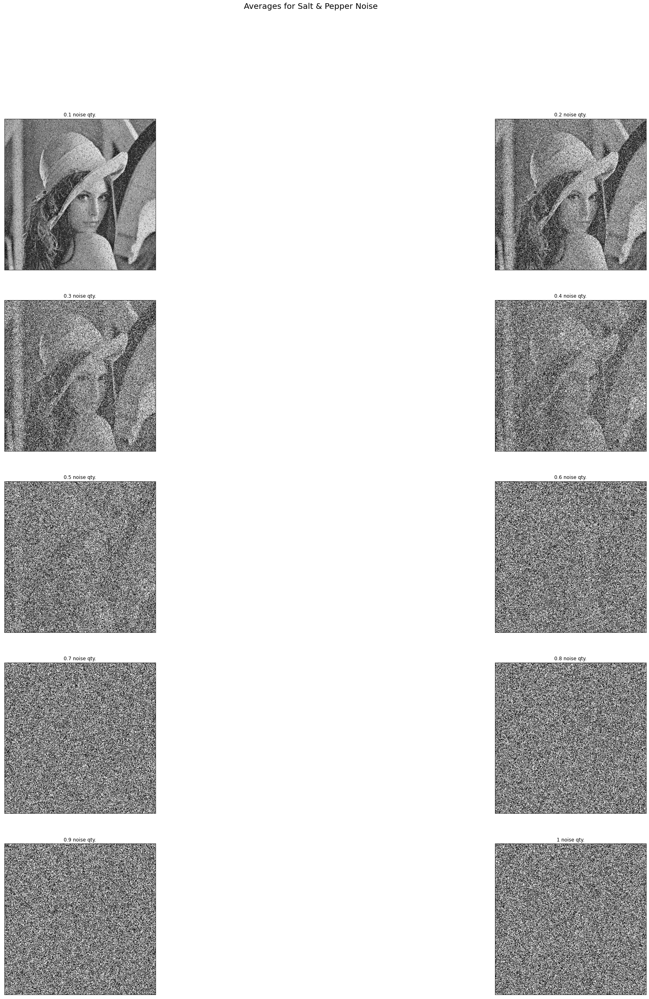

In [38]:
lena = cv.imread('Lena.png')
lenag = cv.cvtColor(lena,cv.COLOR_BGR2GRAY)
cv.imshow("Lena(Original)",lena)
cv.imshow("Lena(Greyscale)",lenag)
cv.waitKey(0)
cv.destroyAllWindows()

outputimg=[]
noise_quantity =[0.1,0.2,0.3,0.4,0.5,0.6,0.7,0.8,0.9,1]
for i in range(10):
    outputimg.append(sp_noise(lenag,noise_quantity[i]))
(fig, axs) =  plt.subplots(nrows=5, ncols=2, figsize=(40, 40))
fig.suptitle("Averages for Salt & Pepper Noise",size=20)
c=0;
for i in range(5):
    for j in range(2):
        axs[i,j].imshow(outputimg[c],cmap='gray')
        axs[i,j].set_title("{} noise qty.".format(noise_quantity[c]))  
        axs[i,j].axes.xaxis.set_visible(False)
        axs[i,j].axes.yaxis.set_visible(False)

        c=c+1;

plt.show()



In [76]:
def correln2d(a,ker) :
    """
    Takes a 2-D array 'a' ,a kernel 'ker', and does 'same' type 2-D correlation
    between array and kernel
    """
    m_orig, n_orig= np.array(a).shape
    k,k=ker.shape
    dim = int((k-1)/2)
    a = np.pad(a, [(dim, dim), (dim, dim)], mode='constant')
    m,n=a.shape
    iter0  = m-k+1
    iter1  = n-k+1
    temp = np.zeros((m_orig, n_orig))
    for i in range (0,iter0):
        for j in range (0,iter1):
            submat_a = a[i:k+i,j:k+j]
            temp[i,j] = np.sum(np.multiply(submat_a,ker))
    return temp

def avg_filter(image,k):
    # Develop Averaging filter(3, 3) mask
    dim=int((k-1)/2)
    mask = np.ones([k, k], dtype = int)
    mask = mask / (k*k)
    new_img = correln2d(image,mask)
    return new_img.tolist()

def median_filter(data, filter_size):
    temp = []
    indexer = filter_size // 2
    data_final = []
    data_final = np.zeros((len(data),len(data[0])))
    for i in range(len(data)):

        for j in range(len(data[0])):

            for z in range(filter_size):
                if i + z - indexer < 0 or i + z - indexer > len(data) - 1:
                    for c in range(filter_size):
                        temp.append(0)
                else:
                    if j + z - indexer < 0 or j + indexer > len(data[0]) - 1:
                        temp.append(0)
                    else:
                        for k in range(filter_size):
                            temp.append(data[i + z - indexer][j + k - indexer])

            temp.sort()
            data_final[i][j] = temp[len(temp) // 2]
            temp = []
    return data_final    

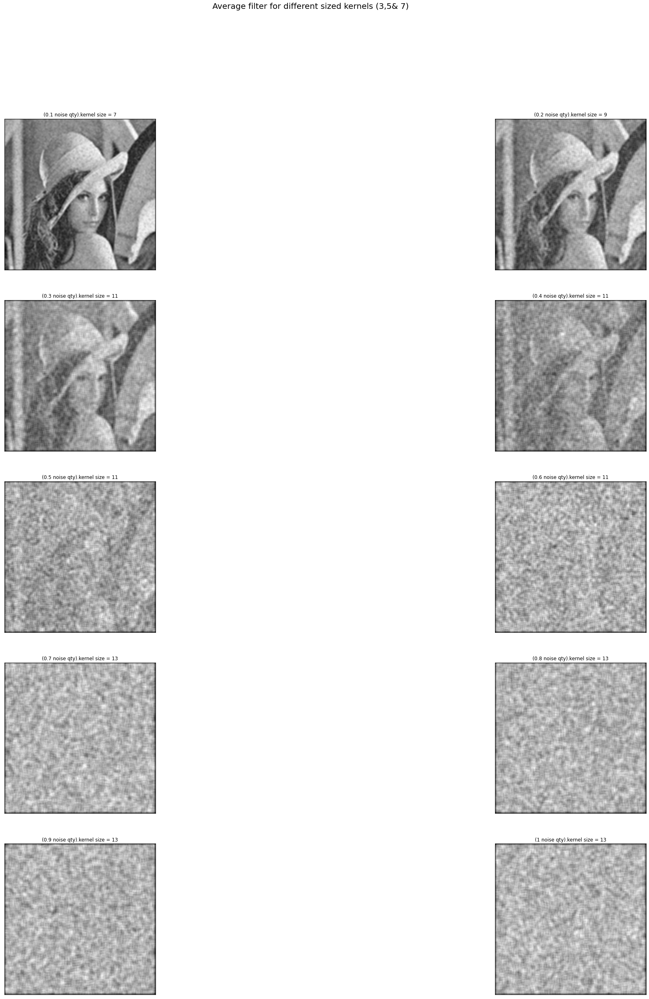

In [60]:
images=[]
filter_sizes = [7,9,11,11,11,11,13,13,13,13]
for i in range(10) :
    images.append(avg_filter(outputimg[i],filter_sizes[i]))
fig,axs = plt.subplots(5,2,figsize=(40, 40)) 
fig.suptitle("Average filter for different sized kernels (3,5& 7)",size=20)
c=0;
for i in range(5):
    for j in range(2):
        axs[i,j].imshow(images[c],cmap='gray')
        axs[i,j].set_title("({} noise qty).kernel size = {}".format(noise_quantity[c],filter_sizes[c]))  
        axs[i,j].axes.xaxis.set_visible(False)
        axs[i,j].axes.yaxis.set_visible(False)

        c=c+1;

plt.show()



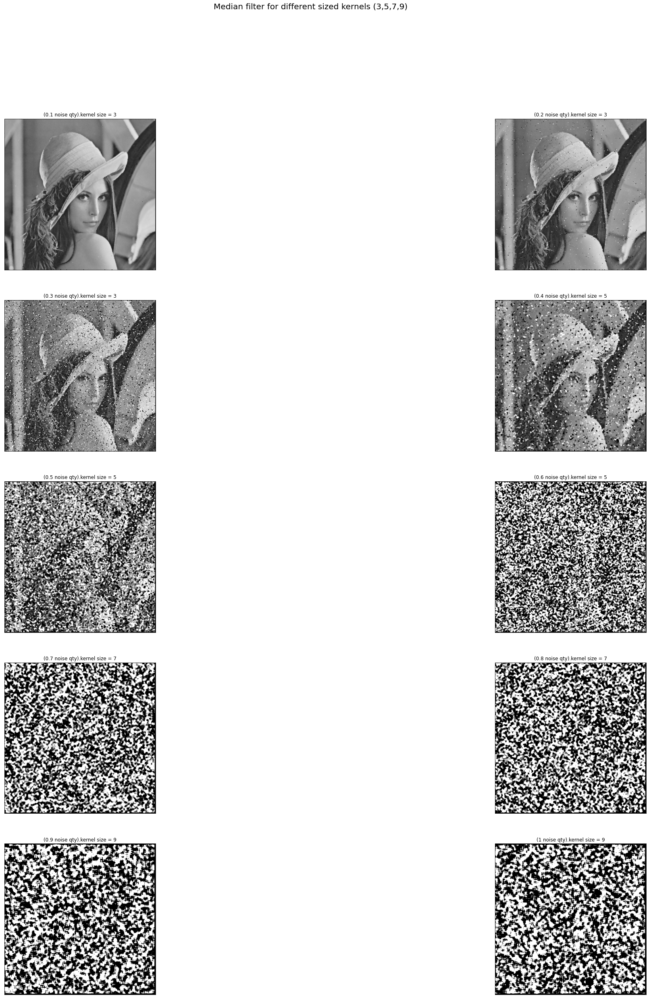

In [77]:
images=[]
filter_sizes = [3,3,3,5,5,5,7,7,9,9]
for i in range(10) :
    images.append(median_filter(outputimg[i],filter_sizes[i]))
fig,axs = plt.subplots(5,2,figsize=(40, 40)) 
fig.suptitle("Median filter for different sized kernels (3,5,7,9)",size=20)
c=0;
for i in range(5):
    for j in range(2):
        axs[i,j].imshow(images[c],cmap='gray')
        axs[i,j].set_title("({} noise qty).kernel size = {}".format(noise_quantity[c],filter_sizes[c]))  
        axs[i,j].axes.xaxis.set_visible(False)
        axs[i,j].axes.yaxis.set_visible(False)

        c=c+1;

plt.show()


---
**Question 2.** 
a. Consider the image the attached named as hdraw.png and crop each of the characters from the image and consider that as the sub-image. Find the location of the sub-image in the original by using correlation.

b. Download Lena color image convert it to grayscale image and crop the left eye of Lena as sub-image and do the cross-correlation ( Normalized correlation) to find the location of the left eye in the original image.

In [52]:
from math import sqrt
def temp_match(target,template):
    tarm,tarn = target.shape
    tempm,tempn = template.shape
    mean_temp = template - np.mean(template)
    M = np.zeros ((tarm-tempm+1,tarn-tempn+1 ) )
    start_point = np.zeros ((tarm-tempm+1,tarn-tempn+1 ) )
    end_point = np.zeros ((tarm-tempm+1,tarn-tempn+1 ) )
    for i in range(0,tarm-tempm+1):
        for j in range(0,tarn-tempn+1):
            Nimage=target[i:i+tempm,j:j+tempn];
            Nimage=Nimage-np.mean(Nimage);
            corr=np.sum(np.multiply(Nimage,mean_temp));
            M[i,j]=corr;
    result = np.where(M == np.amax(M))
    listOfCordinates = list(zip(result[0], result[1]))
    for cord in listOfCordinates:
        max_index_row,max_index_col = cord
    bbox_startpt = [max_index_col,max_index_row]
    bbox_endpt = [max_index_col+tempn,max_index_row + tempm]
    return bbox_startpt,bbox_endpt,M


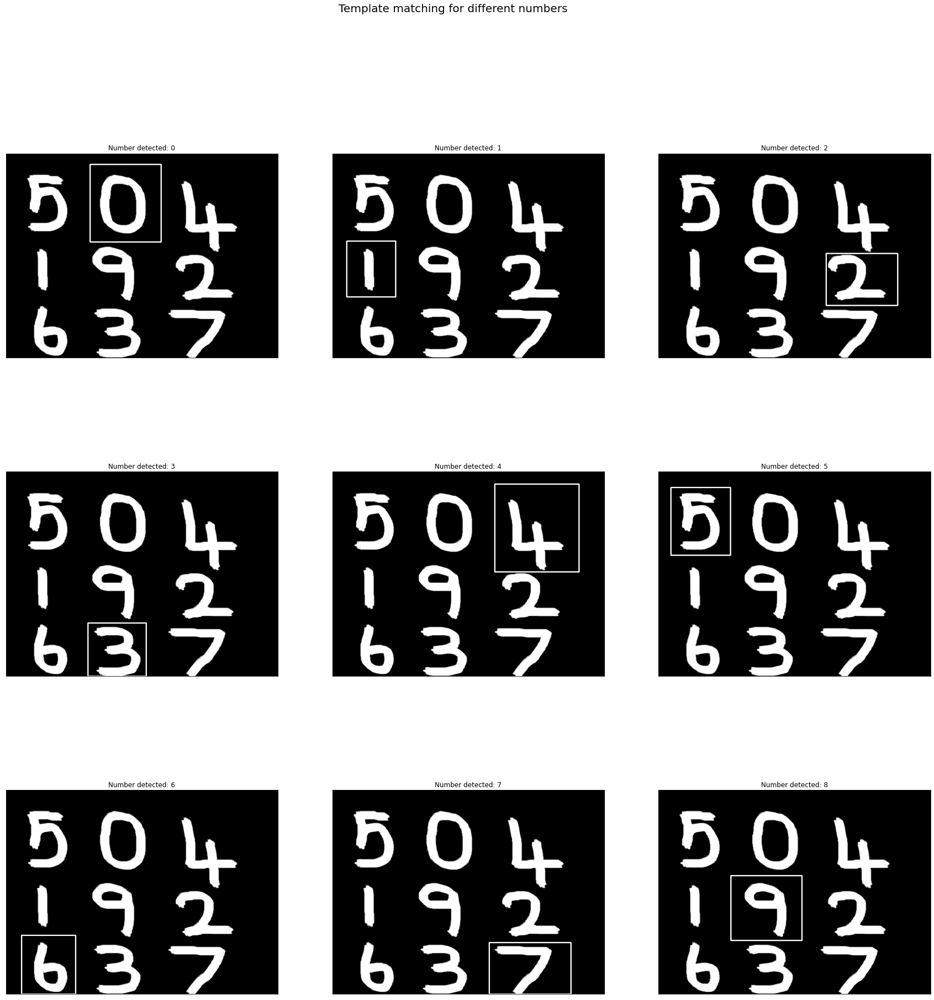

In [54]:
target = cv.imread('q2_images/hdraw.png')
target = cv.cvtColor(target,cv.COLOR_BGR2GRAY)
template0 = cv.imread('q2_images/0.png')
template0 = cv.cvtColor(template0,cv.COLOR_BGR2GRAY)
template1 = cv.imread('q2_images/1.png')
template1 = cv.cvtColor(template1,cv.COLOR_BGR2GRAY)
template2 = cv.imread('q2_images/2.png')
template2 = cv.cvtColor(template2,cv.COLOR_BGR2GRAY)
template3 = cv.imread('q2_images/3.png')
template3 = cv.cvtColor(template3,cv.COLOR_BGR2GRAY)
template4 = cv.imread('q2_images/4.png')
template4 = cv.cvtColor(template4,cv.COLOR_BGR2GRAY)
template5 = cv.imread('q2_images/5.png')
template5 = cv.cvtColor(template5,cv.COLOR_BGR2GRAY)
template6 = cv.imread('q2_images/6.png')
template6 = cv.cvtColor(template6,cv.COLOR_BGR2GRAY)
template7 = cv.imread('q2_images/7.png')
template7 = cv.cvtColor(template7,cv.COLOR_BGR2GRAY)
template9 = cv.imread('q2_images/9.png')
template9 = cv.cvtColor(template9,cv.COLOR_BGR2GRAY)

templates =[template0,template1,template2,template3,template4,template5,template6,template7,template9]
bbox_startpt=[[0,0],[0,0],[0,0],[0,0],[0,0],[0,0],[0,0],[0,0],[0,0]]
bbox_endpt =[[0,0],[0,0],[0,0],[0,0],[0,0],[0,0],[0,0],[0,0],[0,0]]

for i in range(9):
    bbox_startpt[i],bbox_endpt[i],M =temp_match(target,templates[i])
images=[]
for i in range(0,9):
    target = cv.imread('q2_images/hdraw.png')
    target = cv.cvtColor(target,cv.COLOR_BGR2GRAY)

    images.append(cv.rectangle(target, tuple(bbox_startpt[i]), tuple(bbox_endpt[i]) , color = (255, 0, 0), thickness =2))
fig,axs = plt.subplots(3,3,figsize=(30, 30)) 
fig.suptitle("Template matching for different numbers",size=20)
c=0;
for i in range(3):
    for j in range(3):
        axs[i,j].imshow(images[c],cmap='gray')
        axs[i,j].set_title("Number detected: {}".format(c))  
        axs[i,j].axes.xaxis.set_visible(False)
        axs[i,j].axes.yaxis.set_visible(False)

        c=c+1;

plt.show()

# cv.imshow("Matched template", image) 
# cv.waitKey(0)
# cv.destroyAllWindows()


### Question 2(b):

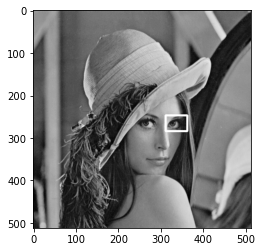

In [59]:
lena = cv.imread('Lena.png')
eye = cv.imread('q2_images/eye.png')
lenag = cv.cvtColor(lena,cv.COLOR_BGR2GRAY)
eyeg=cv.cvtColor(eye,cv.COLOR_BGR2GRAY)
bbox_startpt,bbox_endpt,M =temp_match(lenag,eyeg)
image=cv.rectangle(lenag, tuple(bbox_startpt), tuple(bbox_endpt) , color = (255, 255, 0), thickness =4)
plt.imshow(image,cmap='gray')
plt.show()